# Plotting paths over night/day background averaged images

In [110]:
%matplotlib inline
#plt.style.use('ggplot')
from pylab import rcParams
rcParams['figure.figsize'] = 16, 12

%load_ext autoreload
%autoreload 2

%load_ext version_information
%version_information numpy, scipy, matplotlib, pandas

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The version_information extension is already loaded. To reload it, use:
  %reload_ext version_information


Software versions
Python 2.7.12 64bit [GCC 5.4.0 20160609]
IPython 5.4.1
OS Linux 4.10.0 32 generic x86_64 with Ubuntu 16.04 xenial
numpy 1.13.1
scipy 0.19.1
matplotlib 2.0.2
pandas 0.20.3
Wed Aug 23 15:27:54 2017 AEST

In [66]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import pandas as pd

import os
import sys
import glob
import json
import cv2
import time
from datetime import datetime

np.random.seed(0)

In [40]:
def get_video_filename(file_path):
    head, tail = os.path.split(file_path)
    str_date_time = os.path.splitext(tail)[0]
    return str_date_time

def get_video_datetime(file_path):
    video_filename = get_video_filename(file_path)
    return datetime.strptime(video_filename, "%Y-%m-%d_%H-%M-%S")

def get_daily_bg_datetime(file_path):
    video_filename = get_video_filename(file_path)
    return datetime.strptime(video_filename, "%Y-%m-%d")

def read_json(coord_file_path):
    with open(coord_file_path) as json_file:
        coords_data = json.load(json_file)
    return coords_data

class SplitDataTime():
    def __init__(self):
        self.video_dt_data = []

    def add_date_time_data(self, date_time, data):
        self.video_dt_data.append({'date_time': date_time, 'data': data})

    def sort_data_into_time_period(self):
        video_dt_data_sorted = sorted(self.video_dt_data, key=lambda k: k['date_time'])

        is_night = True
        night_hours = [19, 20, 21, 22, 23, 0, 1, 2, 3, 4, 5, 6]

        current_data_list = []
        night_data_lists = []
        day_data_lists = []
        for dt_data in video_dt_data_sorted:
            hour = dt_data['date_time'].hour
            hour_data = dt_data['data']
            if is_night:
                if hour in night_hours:
                    current_data_list.append(hour_data)
                else:
                    night_data_lists.append(current_data_list)
                    current_data_list = [hour_data]
                    is_night = False
            else:
                if hour not in night_hours:
                    current_data_list.append(hour_data)
                else:
                    day_data_lists.append(current_data_list)
                    current_data_list = [hour_data]
                    is_night = True

        if len(current_data_list) > 0:
            if is_night:
                night_data_lists.append(current_data_list)
            else:
                day_data_lists.append(current_data_list)
            current_data_list = []

        return {'night': night_data_lists, 'day': day_data_lists}
    
def combine_night_day_bg(image_directory_path, averaged_img_directory, output_image_files):
    sdt = SplitDataTime()
    for bg_image_file in glob.glob(image_directory_path + '*.png'):
        image = cv2.imread(bg_image_file, cv2.IMREAD_GRAYSCALE)
        video_dt = get_video_datetime(bg_image_file)
        sdt.add_date_time_data(video_dt, image)

    night_day_data_lists = sdt.sort_data_into_time_period()
    night_day_images = {'night': [], 'day': []}
    for night_or_day in night_day_data_lists.keys():
        night_or_day_count = 0
        night_or_day_id = {'night': '_0_', 'day': '_1_'}
        for time_group in night_day_data_lists[night_or_day]:
            bg_image = time_group[0].astype(np.float64)
            num_images_averaged = 1
            for im in time_group[1:]:
                bg_image += im.astype(np.float64)
                num_images_averaged += 1
            norm_img = bg_image / num_images_averaged
            norm_img = norm_img.astype(np.uint8)
            night_day_images[night_or_day].append(norm_img)
            if output_image_files:
                image_filename = str(night_or_day_count) + night_or_day_id[night_or_day] + night_or_day + '.png'
                file_output = os.path.join(averaged_img_directory, image_filename)
                cv2.imwrite(file_output, norm_img)
                night_or_day_count += 1

    return night_day_images

In [41]:
def read_all_processed_paths_files(processed_paths_dir):
    if processed_paths_dir[-1] != '/':
        processed_paths_dir += '/'
    json_file_list = glob.glob(processed_paths_dir + '*.json')
    
    video_dt_paths = []
    for json_file in json_file_list:
        path_data = read_json(json_file)
        video_date_time = get_video_datetime(json_file)
        video_dt_paths.append({'date_time': video_date_time, 'paths': path_data})
        
    sorted_video_dt_paths = sorted(video_dt_paths, key=lambda k: k['date_time']) 
    return sorted_video_dt_paths

In [42]:
processed_paths_dir = '/home/jack/Data/Caffeine_Unique_Tags/processed/'
video_dt_paths = read_all_processed_paths_files(processed_paths_dir)

In [46]:
sdt_paths = SplitDataTime()
for dt_path in video_dt_paths:
    date_time = dt_path['date_time']
    paths_in_time_period = []
    for bee in dt_path['paths']:
        if bee['tag_class'] == 50: #32
            for path_index in range(len(bee['x_paths'])):
                paths_in_time_period.append((bee['x_paths'][path_index], bee['y_paths'][path_index]))
    sdt_paths.add_date_time_data(date_time, paths_in_time_period)

night_day_path_lists = sdt_paths.sort_data_into_time_period()

In [61]:
len(night_day_path_lists['day'][2][0][0])
# night_day_path_lists['day']: all day groups
# night_day_path_lists['day'][0]: all hour groups
# night_day_path_lists['day'][2][0]: all path groups
# len(night_day_path_lists['day'][2][0][0]: xy path group

2

In [47]:
image_directory_path = '/home/jack/Data/Caffeine_Unique_Tags/background/'
averaged_img_directory = ''
output_image_files = False
night_day_images = combine_night_day_bg(image_directory_path, averaged_img_directory, output_image_files)

In [106]:
def plot_path_bg(bg_image, night_day_grouped_paths, count_images, night_or_day):
    plt.figure()
    for hour_group in night_day_grouped_paths:
        for xy_path in hour_group:
            plt.plot(xy_path[0], xy_path[1], alpha=0.2, color='r')
    plt.imshow(bg_image, cmap = cm.Greys_r)
    plt.text(40, 80, str(count_images).zfill(3) + ' ' + night_or_day, fontsize=14, color='r', fontweight='bold')
    plt.axis('off')
    plt.savefig(str(count_images).zfill(3) + '.png', dpi=100)
    plt.show()

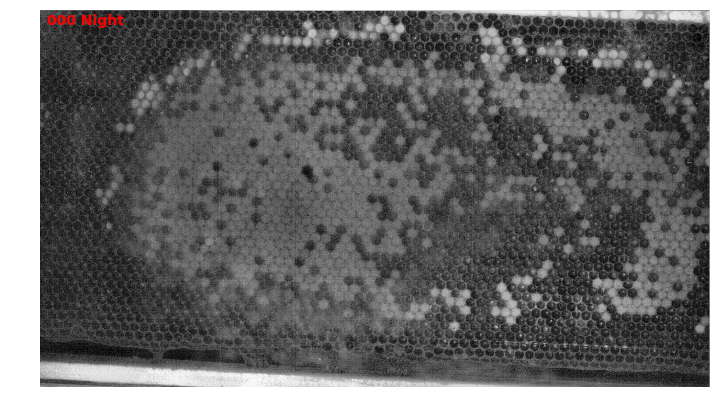

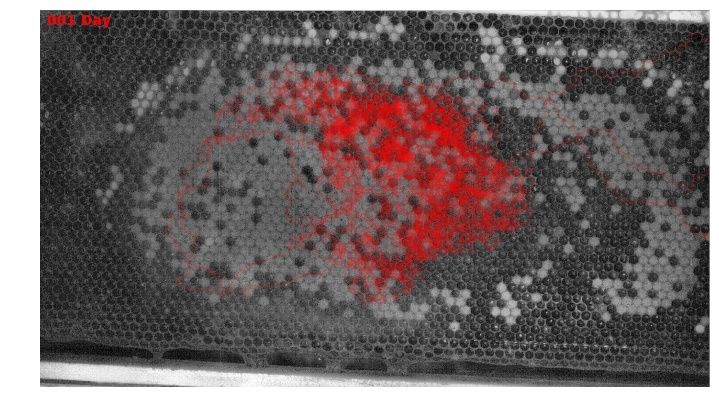

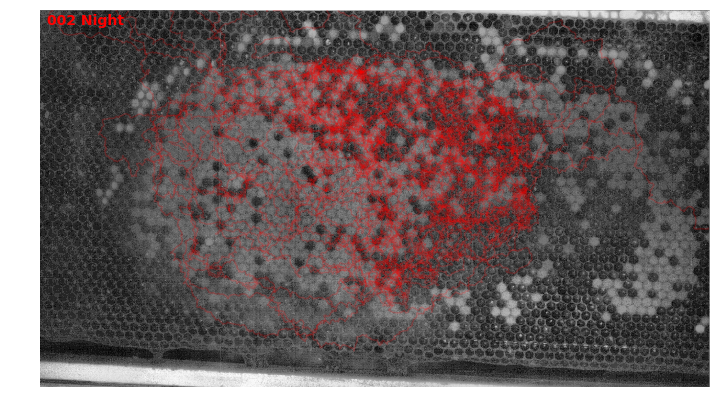

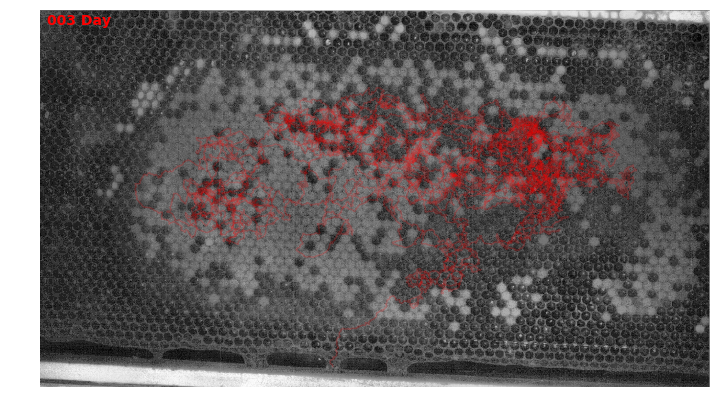

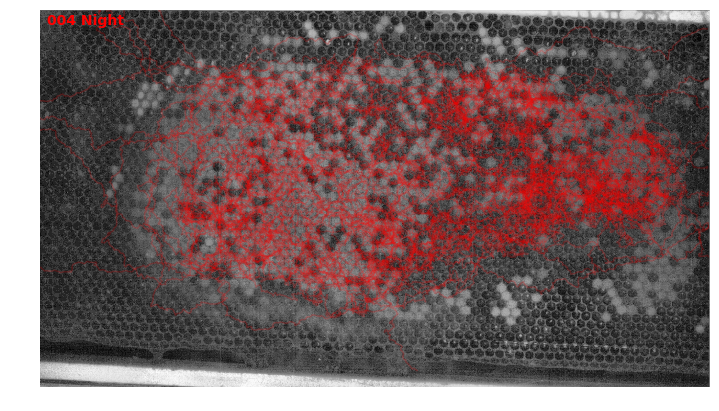

...

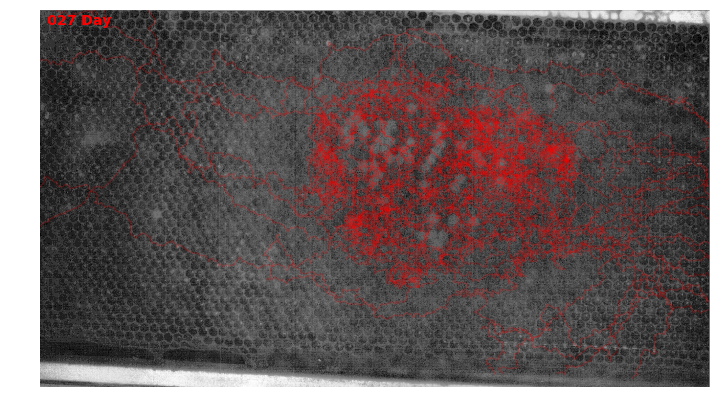

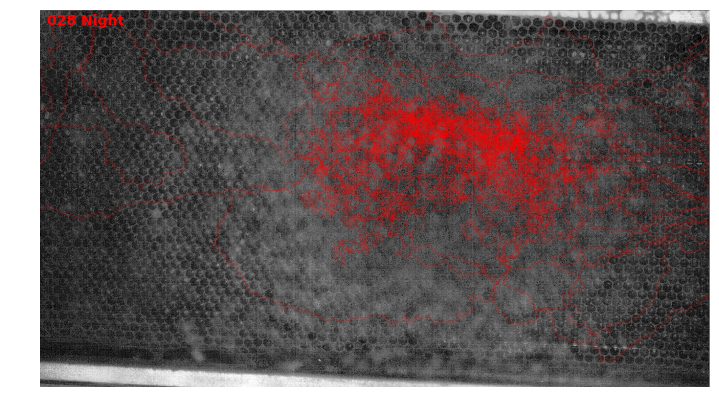

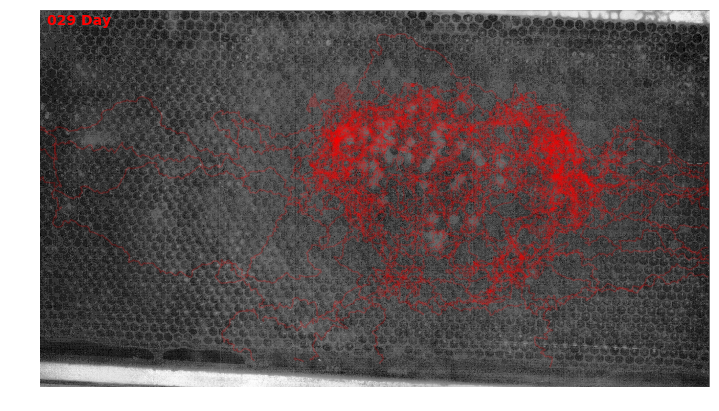

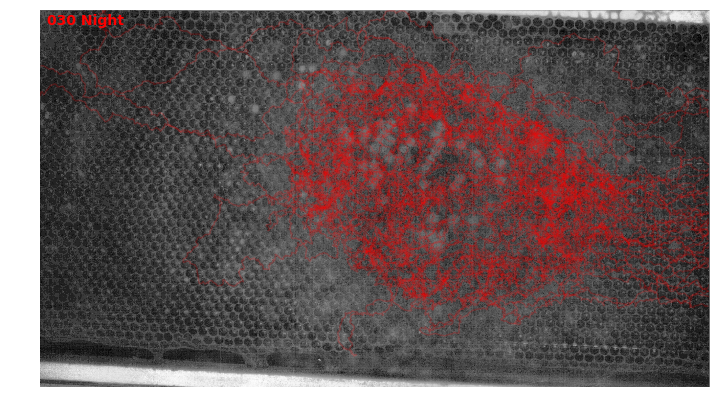

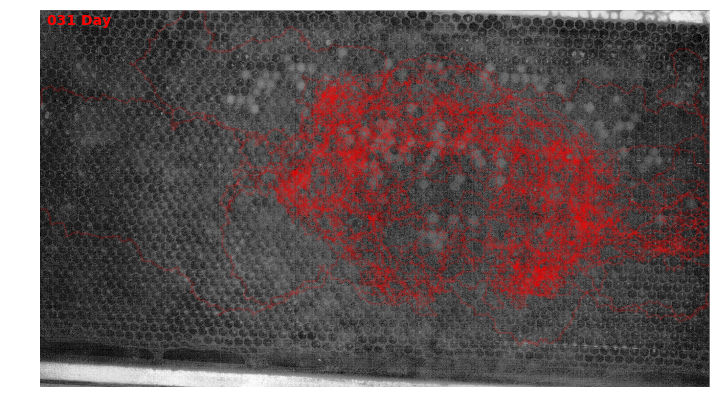

In [109]:
count_images = 0
for i in range(len(night_day_path_lists['night'])):
    plot_path_bg(night_day_images['night'][i], night_day_path_lists['night'][i], count_images, 'Night')
    count_images += 1
    if i > len(night_day_path_lists['day']):
        continue
    plot_path_bg(night_day_images['day'][i], night_day_path_lists['day'][i], count_images, 'Day')
    count_images += 1